In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import os
import matplotlib.pyplot as pl
import igraph
#import scvelo as scv
#import loonpy as lnp
import anndata 
from scipy import io
from scipy.sparse import coo_matrix,csr_matrix


In [2]:
import stereo as st
import warnings
warnings.filterwarnings('ignore')

In [3]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your Stereo-seq data (.h5ad file)
#adata = sc.read_h5ad("liver_stereoseq.h5ad")

# Quick check
#adata


In [4]:
import matplotlib.pyplot as plt

In [ ]:
adata = sc.read_h5ad("4815_Refannotation.h5ad")

In [ ]:
adata

In [ ]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
marker_genes = [
    "LOC132344794","ALB","CYP2E1","APOA2", "ORM1","FGA","APOE","AMBP","C3","SELENOP","TF","FGB","APOA1", "VTN",
    "KNG1", "FGG", "COX1", "ASS1", "PCK1", "CYTB", "FAB1", "ND3"
]

In [37]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

In [15]:
adata

AnnData object with n_obs × n_vars = 111539 × 18680
    obs: 'nCount_Spatial', 'nFeature_Spatial', 'percent.mito', 'orig.ident', 'x', 'y', 'cell_type'
    var: 'n_cells', 'n_counts', 'mean_umi'
    uns: 'X_name', 'raw_cellname', 'raw_counts', 'raw_genename', 'sn'
    obsm: 'spatial'

In [40]:
cell_types_to_keep = [
    'Hepatocytes',
    'Cholangiocytes',
    'Kupffer cells',
    'Liver sinusoidal endothelial cells',
    'Neutrophils'
]

adata1 = adata[adata.obs['cell_type'].isin(cell_types_to_keep)].copy()


In [41]:
Cell_type=adata[adata.obs['cell_type']== ('Hepatocytes','Cholangiocytes','Kupffer cells','Liver sinusoidal endothelial cells','Neutrophils'),].copy()

In [42]:
adata1

AnnData object with n_obs × n_vars = 102755 × 18680
    obs: 'nCount_Spatial', 'nFeature_Spatial', 'percent.mito', 'orig.ident', 'x', 'y', 'cell_type'
    var: 'n_cells', 'n_counts', 'mean_umi'
    uns: 'X_name', 'raw_cellname', 'raw_counts', 'raw_genename', 'sn'
    obsm: 'spatial'

In [ ]:
adata1.obs['cell_type']

✅ Found 1 marker genes: ['APOA2']


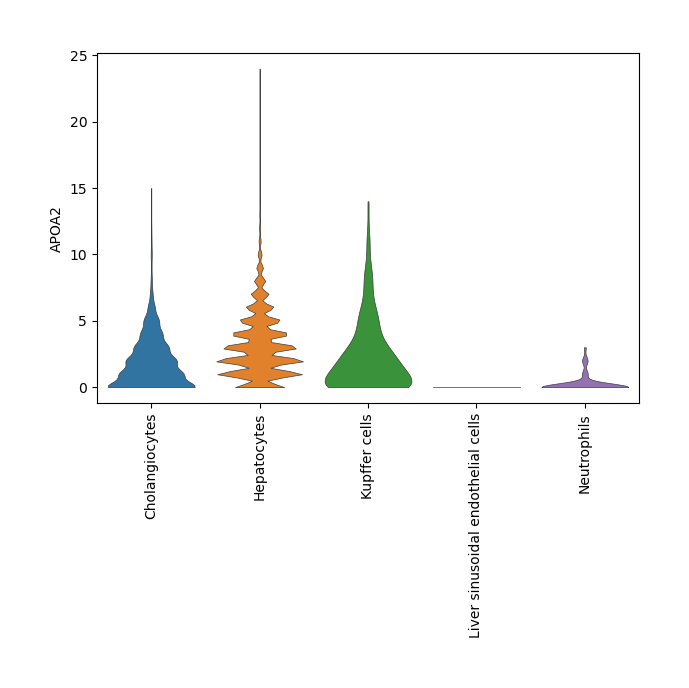

In [47]:
# Define your marker genes (replace with your own gene list)
marker_genes = [
   "APOA2"
]
# Check that the genes exist in your data
existing_genes = [g for g in marker_genes if g in adata.var_names]
print(f"✅ Found {len(existing_genes)} marker genes: {existing_genes}")

# Create violin plot by cell type
sc.pl.violin(
    adata1,
    keys=existing_genes,
    groupby="cell_type",        # change to your annotation column
    stripplot=False,           # removes jittered points
    multi_panel=False,          # plot each gene in its own row
    rotation=90,
    jitter=0,
    show=True,
    figsize=(12,10)
)

In [ ]:
# Define your marker genes (replace with your own gene list)
marker_genes = [
   "GLUL"
]
# Check that the genes exist in your data
existing_genes = [g for g in marker_genes if g in adata.var_names]
print(f"✅ Found {len(existing_genes)} marker genes: {existing_genes}")

# Create violin plot by cell type
sc.pl.violin(
    adata1,
    keys=existing_genes,
    groupby="cell_type",        # change to your annotation column
    stripplot=False,           # removes jittered points
    multi_panel=False,          # plot each gene in its own row
    rotation=90,
    jitter=0,
    show=True,
    figsize=(12,10)
)

In [ ]:
# Define your marker genes (replace with your own gene list)
marker_genes = [
   "ALB","CYP2E1","ORM1","CYP1A2","PCK1"
]
# Check that the genes exist in your data
existing_genes = [g for g in marker_genes if g in adata.var_names]
print(f"✅ Found {len(existing_genes)} marker genes: {existing_genes}")

# Create violin plot by cell type
sc.pl.violin(
    adata1,
    keys=existing_genes,
    groupby="cell_type",        # change to your annotation column
    stripplot=False,           # removes jittered points
    multi_panel=False,          # plot each gene in its own row
    rotation=90,
    jitter=0,
    show=True,
    figsize=(12,10)
)


In [35]:
adata.obs['cell_type'].value_counts()

Hepatocytes                           100556
Unknown cells                           7315
Cholangiocytes                          1844
NK T cells                               753
T cells                                  564
Kupffer cells                            297
Plasma cells                              61
Neutrophils                               54
Dendritic cells                           38
B cells                                   24
Myofibroblasts                            12
Blood vascular endothelial cells           8
NK cells                                   6
Liver sinusoidal endothelial cells         4
Proliferative dendritic cells              3
Name: cell_type, dtype: int64

In [49]:
adata.uns["raw_cellname"]

array(['858993462250', '1073741826700', '1073741827100', ...,
       '88261577936950', '88261577937000', '88261577937100'], dtype=object)

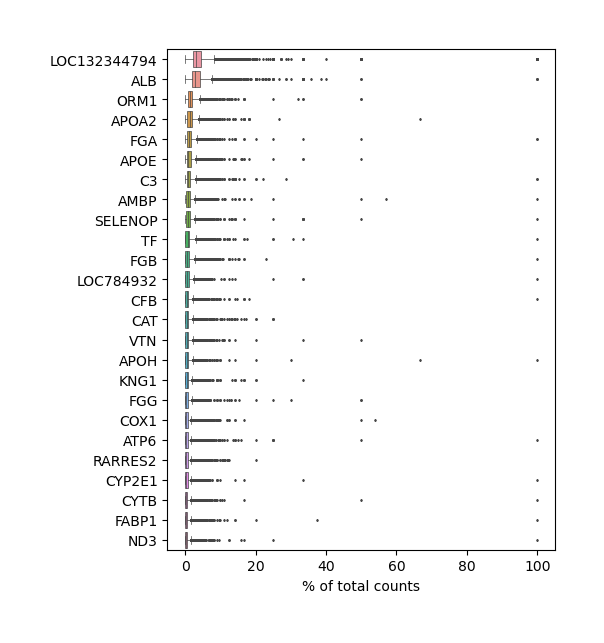

In [8]:
sc.pl.highest_expr_genes(adata, n_top=25)

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=50)

In [26]:
data_path = './B03022E1.tissue.gef'
#st.io.read_gef_info(data_path)

In [27]:
data = st.io.read_gef(file_path=data_path, bin_size=50)

[2025-12-16 10:03:16][Stereo][19240][MainThread][24528][reader][1339][INFO]: read_gef begin ...


[2025-12-16 10:03:20][Stereo][19240][MainThread][24528][reader][1488][INFO]: the matrix has 111539 cells, and 18680 genes.
[2025-12-16 10:03:20][Stereo][19240][MainThread][24528][reader][1489][INFO]: read_gef end.


In [16]:
data

In [29]:
data.tl.cal_qc()

[2025-12-16 10:03:23][Stereo][19240][MainThread][24528][st_pipeline][41][INFO]: start to run cal_qc...
[2025-12-16 10:03:23][Stereo][19240][MainThread][24528][st_pipeline][44][INFO]: cal_qc end, consume time 0.1863s.


In [ ]:
data.cells['cellType']=adata.obs['cell_type']

In [ ]:
data.cells['cellType']

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

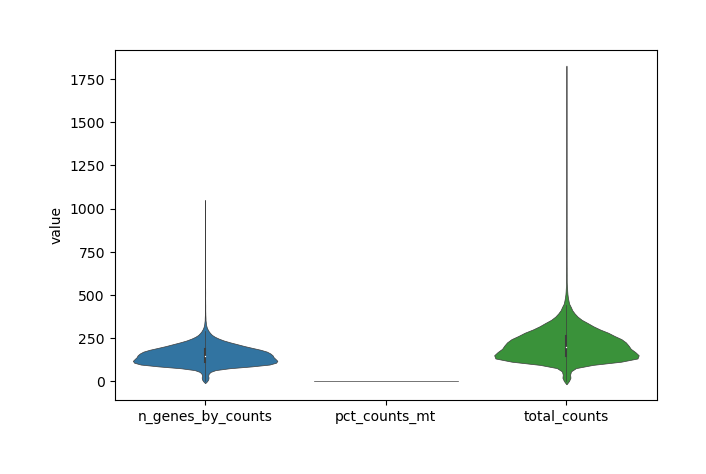

In [31]:
data.plt.violin()

In [ ]:
data.plt.spatial_scatter()

In [ ]:
data.plt.genes_count()

In [23]:
data.tl.filter_cells(
        min_counts=25,
        min_genes=10,
        pct_counts_mt=5,
        inplace=True
        )
data

[2025-12-09 10:11:29][Stereo][54576][MainThread][15256][st_pipeline][41][INFO]: start to run filter_cells...
[2025-12-09 10:11:29][Stereo][54576][MainThread][15256][st_pipeline][44][INFO]: filter_cells end, consume time 0.1073s.


StereoExpData object with n_cells X n_genes = 110747 X 18680
bin_type: bins
bin_size: 50
offset_x = 2
offset_y = 0
cells: ['cell_name', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi']
cells_matrix = ['spatial']
Layers with keys: 
tl.result: []

In [8]:
data.tl.raw_checkpoint()

In [9]:
data.tl.raw

StereoExpData object with n_cells X n_genes = 111539 X 18680
bin_type: bins
bin_size: 50
offset_x = 2
offset_y = 0
cells: ['cell_name']
genes: ['gene_name']
cells_matrix = ['spatial']
Layers with keys: 
tl.result: []

In [70]:
##Normalization

In [10]:
data.tl.normalize_total(target_sum=10000)
data.tl.log1p()

[2025-12-16 09:54:04][Stereo][19240][MainThread][24528][st_pipeline][41][INFO]: start to run normalize_total...
[2025-12-16 09:54:04][Stereo][19240][MainThread][24528][st_pipeline][44][INFO]: normalize_total end, consume time 0.1695s.
[2025-12-16 09:54:04][Stereo][19240][MainThread][24528][st_pipeline][41][INFO]: start to run log1p...
[2025-12-16 09:54:04][Stereo][19240][MainThread][24528][st_pipeline][44][INFO]: log1p end, consume time 0.2036s.


In [11]:
data.tl.highly_variable_genes(
        min_mean=0.0125,
        max_mean=3,
        min_disp=0.5,
        n_top_genes=2000,
        res_key='highly_variable_genes'
        )

[2025-12-16 09:54:07][Stereo][19240][MainThread][24528][st_pipeline][41][INFO]: start to run highly_variable_genes...
[2025-12-16 09:54:08][Stereo][19240][MainThread][24528][st_pipeline][44][INFO]: highly_variable_genes end, consume time 0.6875s.


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

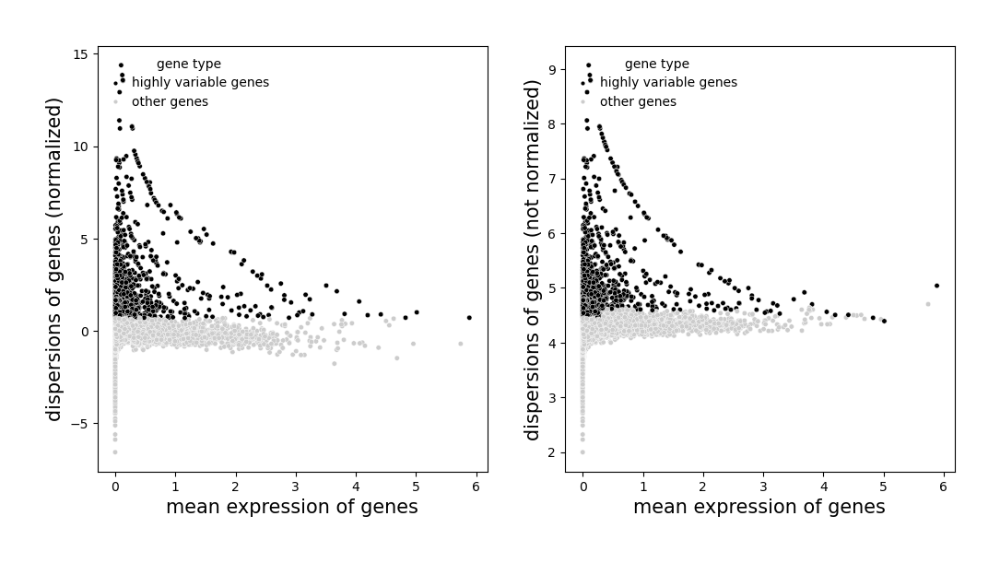

In [12]:
data.plt.highly_variable_genes(res_key='highly_variable_genes')


In [13]:
data.tl.pca(
        use_highly_genes=False,
        n_pcs=30,
        res_key='pca'
        )

[2025-12-16 09:54:15][Stereo][19240][MainThread][24528][st_pipeline][41][INFO]: start to run pca...
[2025-12-16 09:54:15][Stereo][19240][MainThread][24528][dim_reduce][78][WARNING]: svd_solver: auto can not be used with sparse input.
Use "arpack" (the default) instead.
[2025-12-16 09:54:21][Stereo][19240][MainThread][24528][st_pipeline][44][INFO]: pca end, consume time 6.0797s.


In [15]:
data.tl.key_record

{'hvg': ['highly_variable_genes'],
 'pca': ['pca'],
 'neighbors': [],
 'umap': [],
 'cluster': [],
 'marker_genes': []}

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

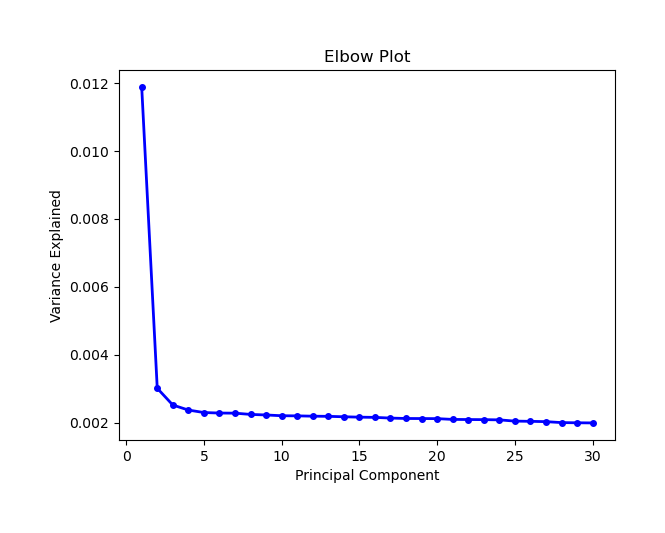

In [16]:
data.plt.elbow(pca_res_key='pca')

In [19]:
##Neighborhood graph
data.tl.neighbors(
        pca_res_key='pca',
        n_pcs=30,
        res_key='neighbors'
        )


[2025-12-16 09:56:37][Stereo][19240][MainThread][24528][st_pipeline][41][INFO]: start to run neighbors...
[2025-12-16 09:57:03][Stereo][19240][MainThread][24528][st_pipeline][44][INFO]: neighbors end, consume time 25.8648s.


In [21]:
#
data.tl.umap(pca_res_key='pca', neighbors_res_key='neighbors', res_key='umap')

[2025-12-16 09:57:06][Stereo][19240][MainThread][24528][st_pipeline][41][INFO]: start to run umap...


	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


[2025-12-16 09:58:07][Stereo][19240][MainThread][24528][st_pipeline][44][INFO]: umap end, consume time 61.2127s.


In [22]:
##Clustering
data.tl.leiden(neighbors_res_key='neighbors', res_key='leiden')

[2025-12-16 09:58:07][Stereo][19240][MainThread][24528][st_pipeline][41][INFO]: start to run leiden...
[2025-12-16 09:59:21][Stereo][19240][MainThread][24528][st_pipeline][44][INFO]: leiden end, consume time 73.2448s.


In [ ]:
data

In [ ]:
data.plt.cluster_scatter(res_key='leiden',dot_size=20,marker='o')

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

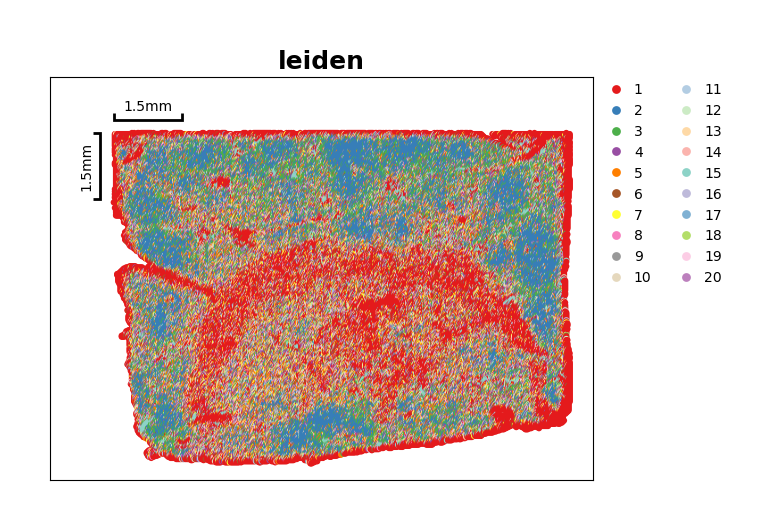

In [31]:
data.plt.cluster_scatter(res_key='leiden',dot_size=20,marker='o')

In [ ]:
##Clustering
#data.tl.leiden(neighbors_res_key='neighbors', res_key='cellType')

In [ ]:
#data.plt.cluster_scatter(res_key='leiden',color="cellType", dot_size=20,marker='o')

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

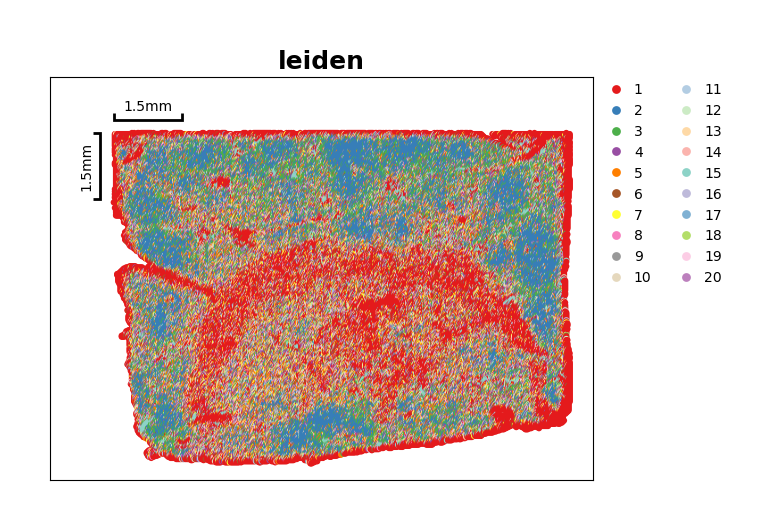

In [63]:
data.plt.cluster_scatter(res_key='leiden',dot_size=20,marker='o')

In [67]:
data

StereoExpData object with n_cells X n_genes = 110747 X 18680
bin_type: bins
bin_size: 50
offset_x = 2
offset_y = 0
cells: ['cell_name', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'cellType', 'leiden', 'Zonation_score', 'Zonation_layer']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi', 'means', 'dispersions', 'mean_bin', 'dispersions_norm', 'highly_variable']
cells_matrix = ['spatial', 'pca', 'umap']
genes_matrix = ['PCs', 'gene_exp_leiden']
cells_pairwise = ['connectivities', 'distances', 'spatial_neighbors_connectivities', 'spatial_neighbors_distances']
Layers with keys: 
tl.key_record: {'hvg': ['highly_variable_genes'], 'pca': ['pca'], 'neighbors': ['neighbors', 'spatial_neighbors'], 'umap': ['umap'], 'cluster': ['leiden'], 'gene_exp_cluster': ['gene_exp_leiden']}
tl.result: ['highly_variable_genes', 'pca', 'neighbors', 'spatial_neighbors', 'umap', 'leiden', 'gene_exp_leiden', 'pca_variance_ratio']

In [42]:
data.cells['cellType']

1503238558900     Hepatocytes
1717986920600     Hepatocytes
1717986920650     Hepatocytes
1717986920700     Hepatocytes
1717986920750     Hepatocytes
                     ...     
87617332852550    Hepatocytes
87617332852600    Hepatocytes
87617332852650    Hepatocytes
87617332852700    Hepatocytes
87617332852750    Hepatocytes
Name: cellType, Length: 110747, dtype: object

In [ ]:
data

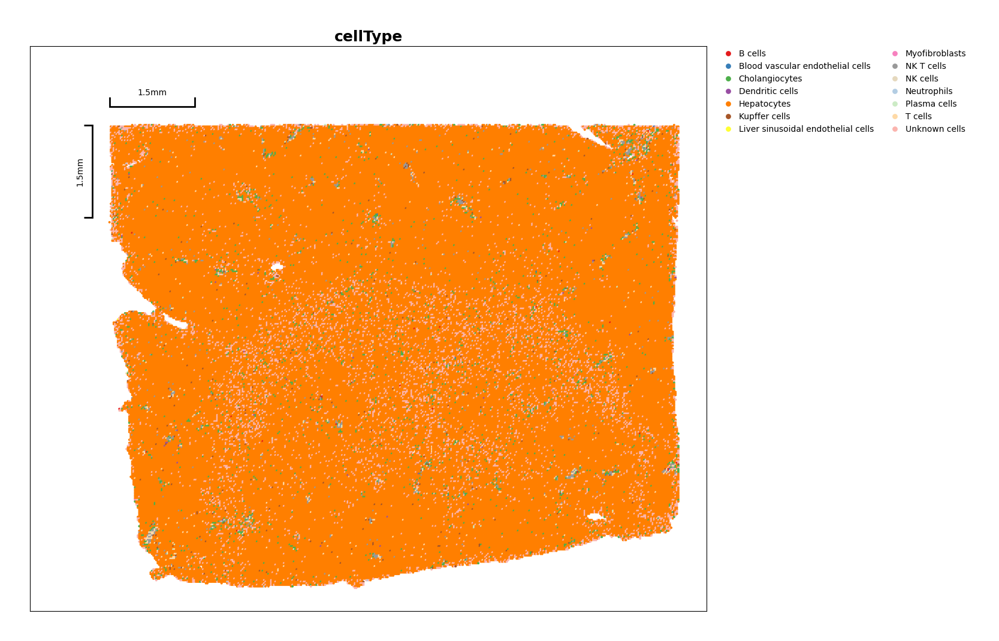

In [82]:
import matplotlib.pyplot as plt
data.plt.cluster_scatter(res_key='cellType',dot_size=8,marker='o')
plt.gcf().set_size_inches(16, 10)  # width x height in inches
plt.tight_layout()
plt.savefig("spatial_plot_4815Liver.png", dpi=600, bbox_inches='tight')

plt.show()

In [87]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load your Stereo-seq data (.h5ad file)
#adata = sc.read_h5ad("liver_stereoseq.h5ad")

# Quick check
adata


AnnData object with n_obs × n_vars = 111539 × 18680
    obs: 'nCount_Spatial', 'nFeature_Spatial', 'percent.mito', 'orig.ident', 'x', 'y', 'cell_type'
    var: 'n_cells', 'n_counts', 'mean_umi'
    uns: 'X_name', 'raw_cellname', 'raw_counts', 'raw_genename', 'sn'
    obsm: 'spatial'

In [90]:
pip install --user scikit-misc


   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   --- ------------------------------------ 0.8/9.9 MB 4.2 MB/s eta 0:00:03
   ------- -------------------------------- 1.8/9.9 MB 4.8 MB/s eta 0:00:02
   ----------- ---------------------------- 2.9/9.9 MB 5.2 MB/s eta 0:00:02
   ---------------- ----------------------- 4.2/9.9 MB 5.2 MB/s eta 0:00:02
   --------------------- ------------------ 5.2/9.9 MB 5.4 MB/s eta 0:00:01
   -------------------------- ------------- 6.6/9.9 MB 5.4 MB/s eta 0:00:01
   ------------------------------ --------- 7.6/9.9 MB 5.3 MB/s eta 0:00:01
   --------------------------------- ------ 8.4/9.9 MB 5.1 MB/s eta 0:00:01
   -------------------------------------- - 9.4/9.9 MB 5.2 MB/s eta 0:00:01
   ---------------------------------------- 9.9/9.9 MB 5.1 MB/s eta 0:00:00


<Figure size 1200x1200 with 0 Axes>

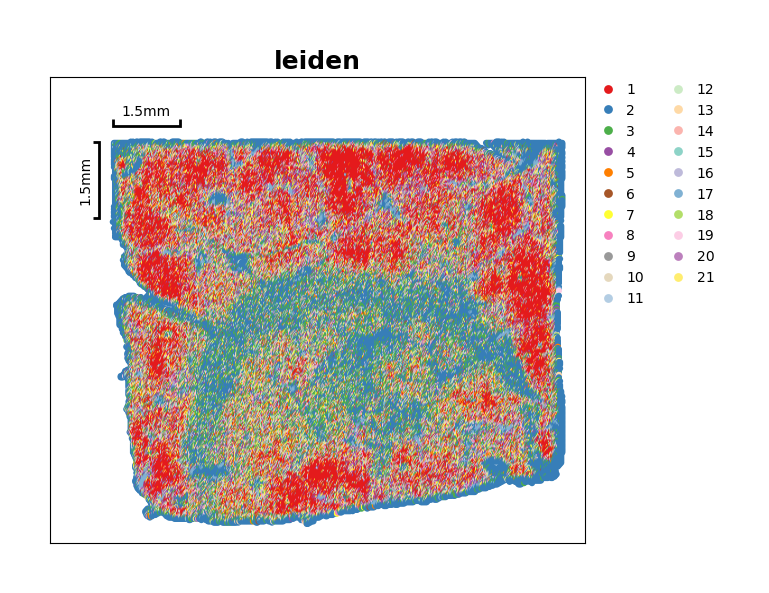

In [77]:
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 12))  # Adjusts figure size
data.plt.cluster_scatter(res_key='leiden', dot_size=20,marker='o')
plt.tight_layout()
plt.savefig("spatial_plot_leiden4815Liver.png", dpi=600, bbox_inches='tight')
plt.show()

In [87]:
hepa = anno1[anno1["cellType"] == "Hepatocytes"]

In [88]:
##hepa=data.cells["cellType"]["Hepatocytes"]

In [89]:
hepa

,cellsID,cellType
0,1503238558900,Hepatocytes
1,1717986920600,Hepatocytes
3,1717986920700,Hepatocytes
4,1717986920750,Hepatocytes
6,1717986920850,Hepatocytes
...,...,...
110741,87617332852500,Hepatocytes
110742,87617332852550,Hepatocytes
110743,87617332852600,Hepatocytes
110744,87617332852650,Hepatocytes


In [91]:
import copy
import numpy as np

# Make a copy of the full StereoExpData
hepa_data = copy.deepcopy(data)

# Filter for Hepatocytes
mask = data.cells["cellType"] == "Hepatocytes"
hepa_data.sub_by_index(cell_index=np.where(mask)[0])

StereoExpData object with n_cells X n_genes = 100228 X 18680
bin_type: bins
bin_size: 50
offset_x = 2
offset_y = 0
cells: ['cell_name', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt', 'Zonation_score', 'Zonation_layer', 'cellType', 'leiden']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi', 'means', 'dispersions', 'mean_bin', 'dispersions_norm', 'highly_variable']
cells_matrix = ['spatial', 'pca', 'umap']
genes_matrix = ['PCs', 'gene_exp_leiden']
cells_pairwise = ['connectivities', 'distances', 'spatial_neighbors_connectivities', 'spatial_neighbors_distances']
Layers with keys: 
tl.key_record: {'hvg': ['highly_variable_genes'], 'pca': ['pca'], 'neighbors': ['neighbors', 'spatial_neighbors'], 'umap': ['umap'], 'cluster': ['leiden'], 'gene_exp_cluster': ['gene_exp_leiden']}
tl.result: ['highly_variable_genes', 'pca', 'neighbors', 'spatial_neighbors', 'umap', 'leiden', 'gene_exp_leiden', 'pca_variance_ratio']

In [ ]:
data.plt.cluster_scatter(res_key='cellType["Hepatocytes"],dot_size=8)

In [ ]:
from stereo.tools import score_genes

In [65]:
from stereo.algorithm.score_genes import ScoreGenes

# Step 1: Create an instance of the ScoreGenes class
scorer = ScoreGenes(data)  # pass your StereoExpData object

# Step 2: Define your gene set
gene_set = ['ALB', 'APOA2', 'FGA', 'TF', 'FGB']

# Step 3: Run the gene scoring
scorer.main(
    genes_used=gene_set,
    res_key='hepatocyte_score',
    ctrl_as_ref=True,
    ctrl_size=50,
    n_bins=25,
    random_state=0
)


[2025-05-30 10:43:28][Stereo][17096][MainThread][28564][score_genes][133][INFO]: calculating score, the result will be saved in data.cells['hepatocyte_score']


In [95]:
adata

AnnData object with n_obs × n_vars = 111539 × 5000
    obs: 'nCount_Spatial', 'nFeature_Spatial', 'percent.mito', 'orig.ident', 'x', 'y', 'cell_type', 'CV_score', 'PV_score', 'Zonation_score', 'Zonation_layer'
    var: 'n_cells', 'n_counts', 'mean_umi', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'X_name', 'raw_cellname', 'raw_counts', 'raw_genename', 'sn', 'log1p', 'hvg', 'pca', 'rank_genes_groups', 'Zonation_layer_colors', 'dendrogram_Zonation_layer'
    obsm: 'spatial', 'X_pca'
    varm: 'PCs'

In [96]:
data.genes

,n_cells,n_counts,mean_umi,means,dispersions,mean_bin,dispersions_norm,highly_variable
20ALPHA-HSD,5,5,1.000000,0.002352,4.097802,"(-0.00464, 0.232]",-0.939357,False
A1BG,16794,20725,1.234072,2.367376,4.146159,"(2.319, 2.551]",-0.473485,False
A1CF,5355,6367,1.188982,1.395762,4.245309,"(1.391, 1.623]",0.103985,False
A2M,936,1055,1.127137,0.407152,4.219216,"(0.232, 0.464]",-1.498361,False
A2ML1,2,2,1.000000,0.001859,4.807142,"(-0.00464, 0.232]",2.968080,True
...,...,...,...,...,...,...,...,...
ZYG11B,509,571,1.121807,0.250647,4.278216,"(0.232, 0.464]",-0.059220,False
ZYX,605,648,1.071074,0.293241,4.239917,"(0.232, 0.464]",-0.993414,False
ZZEF1,363,417,1.148760,0.188868,4.360184,"(-0.00464, 0.232]",0.505988,False
ZZZ3,770,919,1.193506,0.352023,4.239159,"(0.232, 0.464]",-1.011897,False


In [163]:
data.genes

,n_cells,n_counts,mean_umi,means,dispersions,mean_bin,dispersions_norm,highly_variable
20ALPHA-HSD,5,5,1.000000,0.001791,3.863138,"(-0.00588, 0.294]",-1.263980,False
A1BG,16794,20725,1.234072,2.266508,4.238350,"(2.059, 2.353]",-0.243601,False
A1CF,5355,6367,1.188982,1.293192,4.262802,"(1.176, 1.47]",0.087754,False
A2M,936,1055,1.127137,0.348616,4.145222,"(0.294, 0.588]",-1.455303,False
A2ML1,2,2,1.000000,0.001358,4.501066,"(-0.00588, 0.294]",1.254596,True
...,...,...,...,...,...,...,...,...
ZYG11B,509,571,1.121807,0.211008,4.166003,"(-0.00588, 0.294]",-0.068253,False
ZYX,605,648,1.071074,0.243365,4.117520,"(-0.00588, 0.294]",-0.259666,False
ZZEF1,363,417,1.148760,0.161823,4.248538,"(-0.00588, 0.294]",0.257602,False
ZZZ3,770,919,1.193506,0.312032,4.233935,"(0.294, 0.588]",-0.407971,False


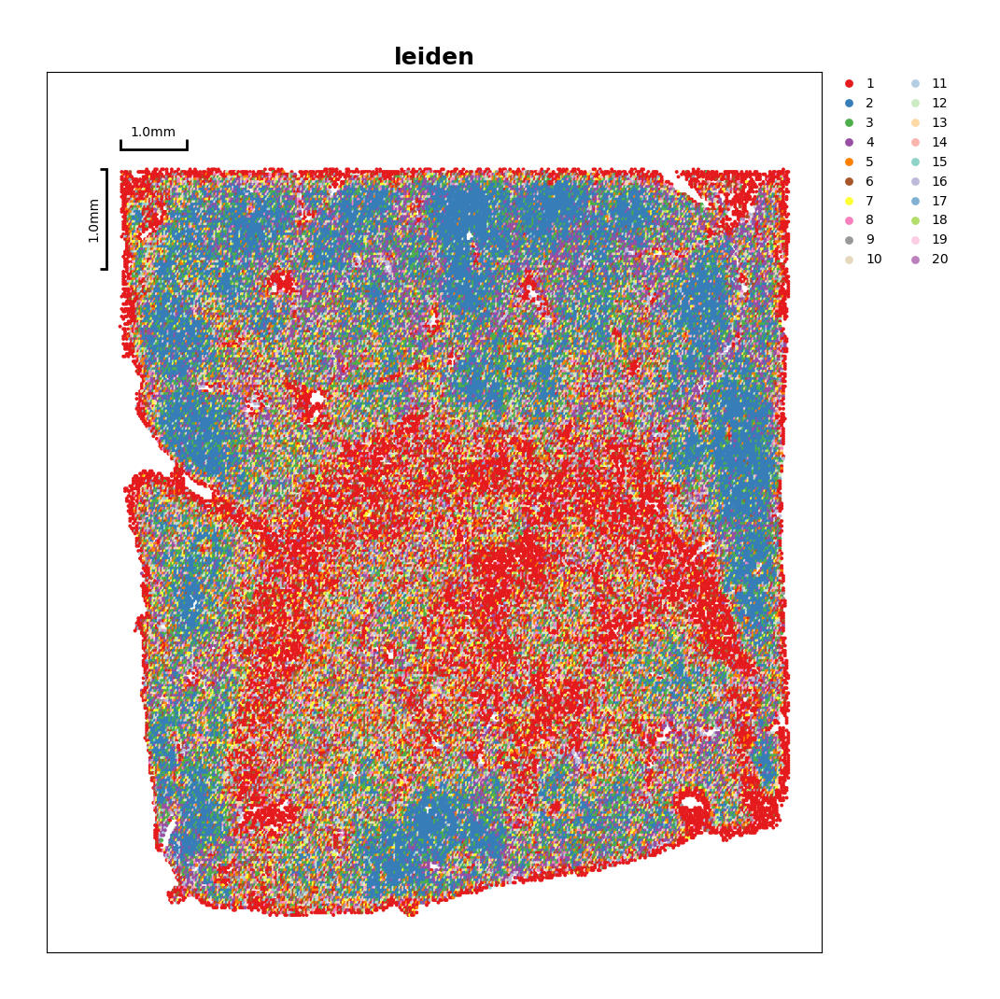

In [70]:
import matplotlib.pyplot as plt

hepa_data.plt.cluster_scatter(
    res_key='leiden',      # color by Leiden cluster
    dot_size=8,
    marker='o'
)

plt.gcf().set_size_inches(10, 10)
plt.tight_layout()
plt.savefig("hepatocytes_leiden.png", dpi=600, bbox_inches='tight')
plt.show()

In [ ]:
data.cells['cellType'] = data.cells['leiden'].map(cluster_to_celltype)

In [73]:
data.cells['cellType']

1503238558900        Hepatocytes
1717986920600        Hepatocytes
1717986920650      Unknown cells
1717986920700        Hepatocytes
1717986920750        Hepatocytes
                       ...      
87617332852550       Hepatocytes
87617332852600       Hepatocytes
87617332852650       Hepatocytes
87617332852700    Cholangiocytes
87617332852750       Hepatocytes
Name: cellType, Length: 110747, dtype: category
Categories (15, object): ['B cells', 'Blood vascular endothelial cells', 'Cholangiocytes', 'Dendritic cells', ..., 'Plasma cells', 'Proliferative dendritic cells', 'T cells', 'Unknown cells']

In [74]:
data.cells['cellType'].value_counts()

Hepatocytes                           100228
Unknown cells                           7008
Cholangiocytes                          1816
NK T cells                               721
T cells                                  541
Kupffer cells                            282
Plasma cells                              57
Dendritic cells                           34
Neutrophils                               23
B cells                                   22
Blood vascular endothelial cells           8
Myofibroblasts                             5
Liver sinusoidal endothelial cells         1
NK cells                                   1
Proliferative dendritic cells              0
Name: cellType, dtype: int64

In [ ]:
data.plt.cluster_scatter(
    res_key='leiden',
    color='cellType',
    groups=['1', '2'],    # only clusters 1 and 2
    dot_size=20,
    marker='o',
    legend=True
)


Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

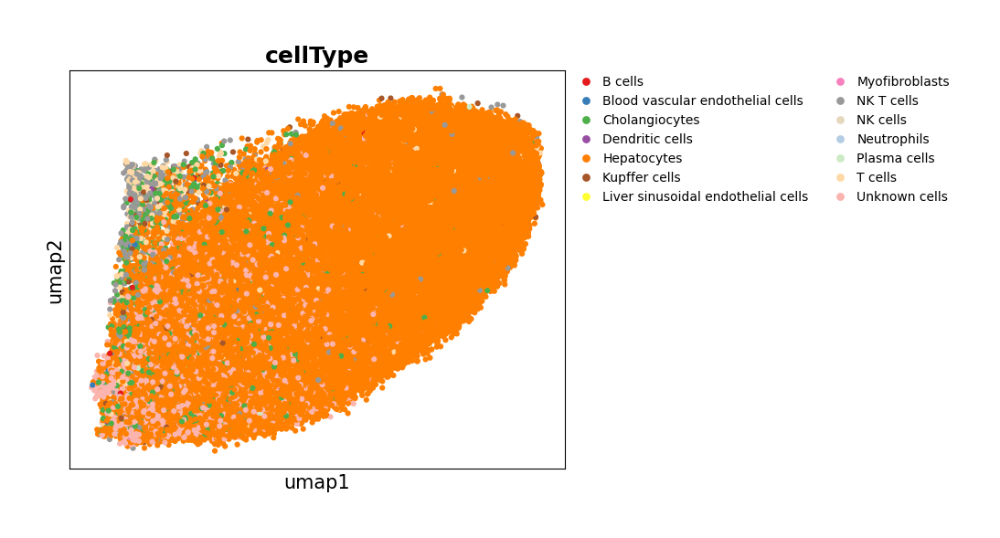

In [92]:
data.plt.umap(res_key='umap', cluster_key='cellType',dot_size=20,marker='o')

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

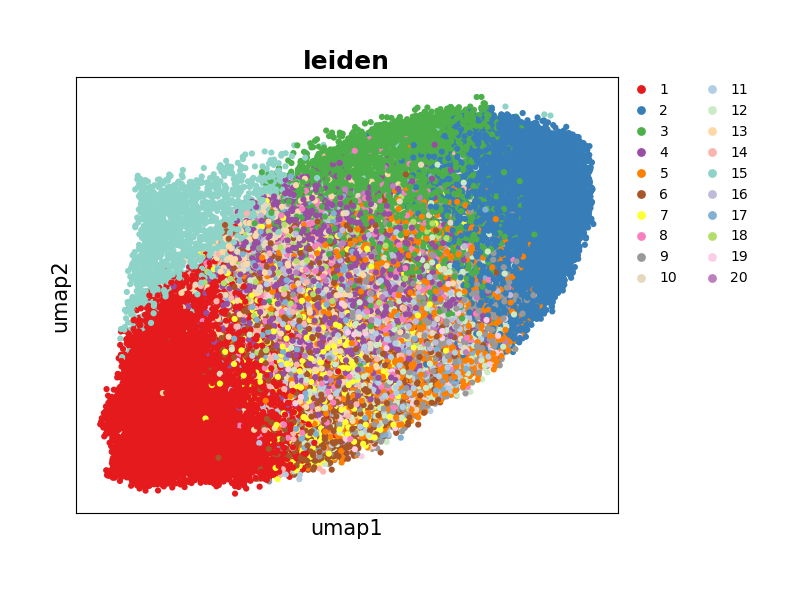

In [33]:
data.plt.umap(res_key='umap', cluster_key='leiden',dot_size=20,marker='o')

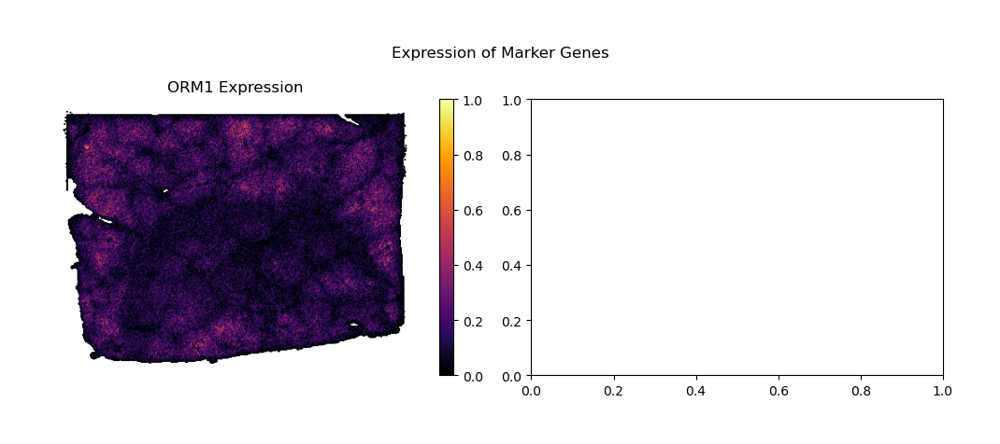

In [35]:
genes = ["ORM1"]#,"FGA"] #["PECAM1", "CLEC4G","MARCO","CD68","ACTA2","COL1A1","CPS1","LYVE1","LYZ"]
#fig, axes = plt.subplots(1, len(genes), figsize=(15, 5))
# ✅ Define grid layout: 2 columns
n_cols = 2
n_rows = int(np.ceil(len(genes) / n_cols))

# ✅ Create figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, n_rows * 4))
axes = axes.flatten()

for i, gene in enumerate(genes):
    expr = data.exp_matrix[:, data.gene_names == gene].toarray().flatten()
    expr_norm = (expr - expr.min()) / (expr.max() - expr.min())
    
    sc = axes[i].scatter(
        data.position[:, 0],
        data.position[:, 1],
        c=expr_norm,
        s=2,
        cmap='inferno'
    )
    axes[i].set_title(f"{gene} Expression")
    axes[i].invert_yaxis()
    axes[i].axis("off")
    plt.colorbar(sc, ax=axes[i], fraction=0.046, pad=0.04)

plt.suptitle("Expression of Marker Genes")
plt.tight_layout()
plt.show()


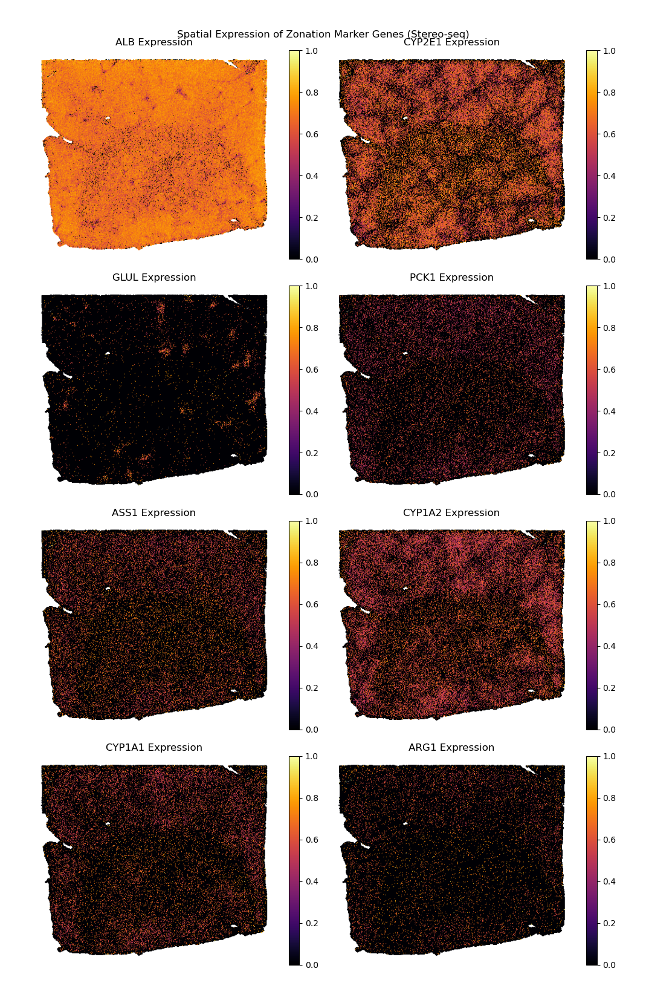

In [34]:
genes = ["ALB", "CYP2E1", "GLUL","PCK1","ASS1","CYP1A2","CYP1A1","ARG1"]
#fig, axes = plt.subplots(1, len(genes), figsize=(15, 5))
# ✅ Define grid layout: 2 columns
n_cols = 2
n_rows = int(np.ceil(len(genes) / n_cols))

# ✅ Create figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, n_rows * 4))
axes = axes.flatten()

for i, gene in enumerate(genes):
    expr = data.exp_matrix[:, data.gene_names == gene].toarray().flatten()
    expr_norm = (expr - expr.min()) / (expr.max() - expr.min())
    
    sc = axes[i].scatter(
        data.position[:, 0],
        data.position[:, 1],
        c=expr_norm,
        s=2,
        cmap='inferno'
    )
    axes[i].set_title(f"{gene} Expression")
    axes[i].invert_yaxis()
    axes[i].axis("off")
    plt.colorbar(sc, ax=axes[i], fraction=0.046, pad=0.04)

plt.suptitle("Spatial Expression of Zonation Marker Genes (Stereo-seq)")
plt.tight_layout()
plt.show()


In [ ]:
##data.cells has the zonation layer from adata.obs [zonation]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Get expression vector for ALB
alb_expr = data.exp_matrix[:, data.gene_names == 'ALB'].toarray().flatten()

# Optional: normalize (0–1 range for better color scaling)
alb_expr_norm = (alb_expr - alb_expr.min()) / (alb_expr.max() - alb_expr.min())

# Plot spatial expression map
data.plt.cluster_scatter(
     res_key='ALB',
    color=alb_expr_norm,
    dot_size=5,
    cmap='inferno',
    scale_bar_length=1500,
    title='ALB Expression (PV marker)'
)
plt.show()


In [ ]:
data.plt.umap(gene_names=['ALB','ORM1','APOA1','APOA2','FGA','APOE','C3','AMBP'], res_key='umap') 

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

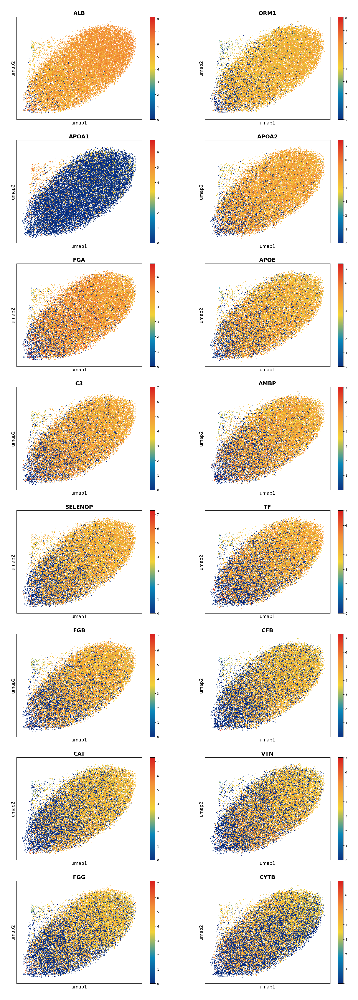

In [36]:
data.plt.umap(gene_names=['ALB','ORM1','APOA1','APOA2','FGA','APOE','C3','AMBP','SELENOP','TF','FGB','CFB','CAT','VTN','FGG','CYTB'], res_key='umap') 

In [40]:
data.tl.louvain(neighbors_res_key='neighbors', res_key='louvain')

[2025-12-03 13:54:19][Stereo][38624][MainThread][6168][st_pipeline][41][INFO]: start to run louvain...
[2025-12-03 13:54:20][Stereo][38624][MainThread][6168][_louvain][109][INFO]:     using the "louvain" package of Traag (2017)
[2025-12-03 13:54:41][Stereo][38624][MainThread][6168][st_pipeline][44][INFO]: louvain end, consume time 21.7304s.


In [ ]:
data.plt.cluster_scatter(res_key='louvain',dot_size=20,marker='o')

In [42]:
data.plt.interact_cluster(res_key='leiden')

Row
    [0] ParamFunction(function, _pane=HoloViews)
    [1] Column
        [0] ColorPicker(name='background color', value='#ffffff', width=200)
        [1] IntSlider(end=200, name='dot size', start=1, value=1, width=200)
        [2] Select(name='color theme', options=['glasbey', 'glasbey_bw', ...], value='stereo_30', width=200)
        [3] Row
            [0] Select(name='cluster', options=['1', '2', '3', ...], value='1', width=100)
            [1] ColorPicker(name='node color', value='#E41A1C', width=70)

In [43]:
print(data.raw) 

StereoExpData object with n_cells X n_genes = 110747 X 18680
bin_type: bins
bin_size: 50
offset_x = 2
offset_y = 0
cells: ['cell_name', 'total_counts', 'n_genes_by_counts', 'pct_counts_mt']
genes: ['gene_name', 'n_cells', 'n_counts', 'mean_umi']
cells_matrix = ['spatial']
Layers with keys: 
tl.result: []


In [44]:
data.tl.raw_checkpoint()

In [109]:
data.cells['cellType']

1503238558900        Hepatocytes
1717986920600        Hepatocytes
1717986920650      Unknown cells
1717986920700        Hepatocytes
1717986920750        Hepatocytes
                       ...      
87617332852550       Hepatocytes
87617332852600       Hepatocytes
87617332852650       Hepatocytes
87617332852700    Cholangiocytes
87617332852750       Hepatocytes
Name: cellType, Length: 110747, dtype: category
Categories (14, object): ['B cells', 'Blood vascular endothelial cells', 'Cholangiocytes', 'Dendritic cells', ..., 'Neutrophils', 'Plasma cells', 'T cells', 'Unknown cells']

In [97]:
data.plt.interact_cluster(res_key='cellType')

Row
    [0] ParamFunction(function, _pane=HoloViews)
    [1] Column
        [0] ColorPicker(name='background color', value='#ffffff', width=200)
        [1] IntSlider(end=200, name='dot size', start=1, value=1, width=200)
        [2] Select(name='color theme', options=['glasbey', 'glasbey_bw', ...], value='stereo_30', width=200)
        [3] Row
            [0] Select(name='cluster', options=['B cells', 'Blood vascula...], value='B cells', width=100)
            [1] ColorPicker(name='node color', value='#E41A1C', width=70)

In [45]:
data.tl.find_marker_genes(
        cluster_res_key='leiden',
        method='t_test',
        use_highly_genes=False,
        use_raw=True
        )

[2025-12-03 13:54:44][Stereo][38624][MainThread][6168][st_pipeline][41][INFO]: start to run find_marker_genes...
[2025-12-03 13:54:46][Stereo][38624][MainThread][6168][tool_base][122][INFO]: read group information, grouping by group column.
[2025-12-03 13:54:46][Stereo][38624][MainThread][6168][tool_base][151][INFO]: start to run...
[2025-12-03 13:54:48][Stereo][38624][MainThread][6168][tool_base][153][INFO]: end to run.
[2025-12-03 13:54:48][Stereo][38624][MainThread][6168][st_pipeline][44][INFO]: find_marker_genes end, consume time 4.1371s.


In [ ]:
data.tl.find_marker_genes(
    cluster_res_key='cellType',
    method='t_test',
    use_highly_genes=False,
    use_raw=True
)


In [ ]:
data.plt.marker_genes_text(
        res_key='marker_genes',
        markers_num=10,
        sort_key='scores'
        )

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

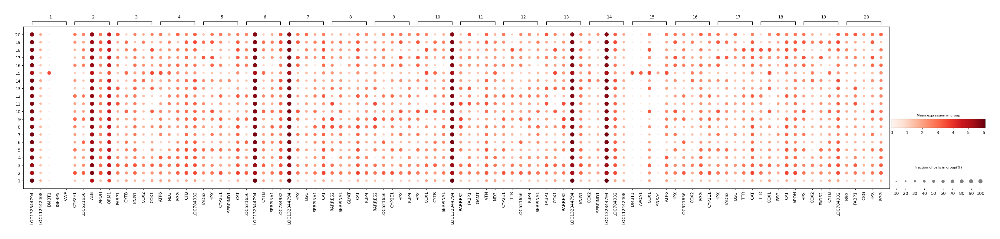

In [47]:
data.plt.marker_genes_scatter(res_key='marker_genes', markers_num=5)

Column
    [0] Markdown(str)
    [1] Row
        [0] TextInput(name='file name', placeholder='Enter a file name...', width=200)
        [1] Select(name='file format', options=['png', 'pdf'], value='png', width=60)
        [2] IntInput(name='dpi', placeholder='Enter the dip...', start=0, value=100, width=200)
    [2] Row
        [0] Button(button_type='primary', name='export', width=100)
        [1] StaticText(width=800)

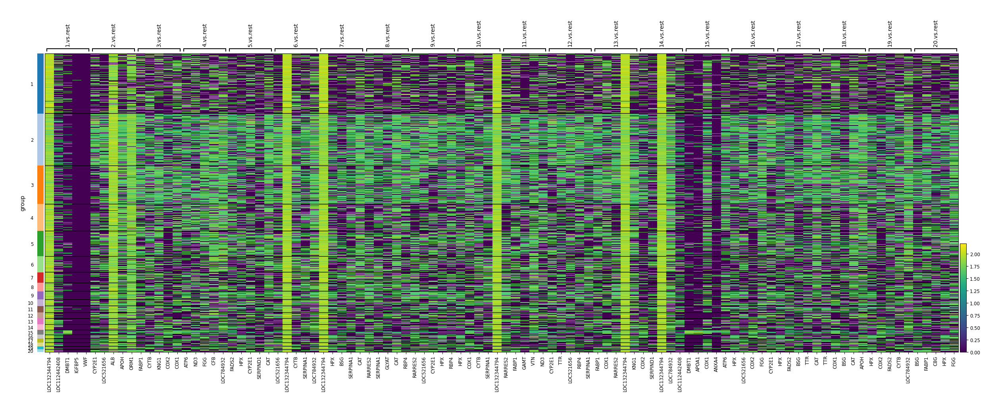

In [48]:
data.plt.marker_genes_heatmap(
    res_key='marker_genes'
)

In [411]:
data.tl.filter_marker_genes(
    marker_genes_res_key='marker_genes',
    min_fold_change=1,
    min_in_group_fraction=0.25,
    max_out_group_fraction=0.5,
    res_key='marker_genes_filtered'
)

[2025-05-12 17:58:04][Stereo][24500][MainThread][29476][st_pipeline][41][INFO]: start to run filter_marker_genes...
[2025-05-12 17:58:05][Stereo][24500][MainThread][29476][st_pipeline][44][INFO]: filter_marker_genes end, consume time 0.6698s.


In [ ]:
##Annotation
data.plt.interact_annotation_cluster(
            res_cluster_key='leiden',
            res_marker_gene_key='marker_genes',
            res_key='leiden_annotation'
            )

In [115]:
deg_results = data.tl.result['marker_genes']

In [ ]:
deg_results

In [ ]:
adata = st.io.stereo_to_anndata(data, output='CattleLiver4815_seurat2_04_15_2025.h5ad')

In [9]:
import pandas as pd
import glob

In [74]:
import numpy as np
import pandas as pd
import scanpy as sc
import scipy
import os
import matplotlib.pyplot as pl
import igraph
#import scvelo as scv
#import loonpy as lnp
import anndata
from scipy import io
from scipy.sparse import coo_matrix,csr_matrix


In [17]:
adata = sc.read_h5ad("4815_Refannotation.h5ad")

In [18]:
adata

AnnData object with n_obs × n_vars = 111539 × 18680
    obs: 'nCount_Spatial', 'nFeature_Spatial', 'percent.mito', 'orig.ident', 'x', 'y', 'cell_type'
    var: 'n_cells', 'n_counts', 'mean_umi'
    uns: 'X_name', 'raw_cellname', 'raw_counts', 'raw_genename', 'sn'
    obsm: 'spatial'

In [ ]:
sc.pl.highest_expr_genes(adata, n_top=50)

In [1]:
results_file = "4815_annotation.h5ad"

In [19]:
sc.pp.filter_cells(adata, min_genes=10)
sc.pp.filter_genes(adata, min_cells=3)

In [20]:
adata

AnnData object with n_obs × n_vars = 111164 × 17076
    obs: 'nCount_Spatial', 'nFeature_Spatial', 'percent.mito', 'orig.ident', 'x', 'y', 'cell_type', 'n_genes'
    var: 'n_cells', 'n_counts', 'mean_umi'
    uns: 'X_name', 'raw_cellname', 'raw_counts', 'raw_genename', 'sn'
    obsm: 'spatial'

In [21]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


In [22]:
 ##annotate the group of mitochondrial genes as "mt"
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

In [23]:
# Compute QC metrics
adata.obs['nCount_RNA'] = adata.X.sum(axis=1).A1 if hasattr(adata.X, "A1") else adata.X.sum(axis=1)
adata.obs['nFeature_RNA'] = (adata.X > 0).sum(axis=1).A1 if hasattr(adata.X, "A1") else (adata.X > 0).sum(axis=1)

# Compute mitochondrial gene percentage (genes starting with 'MT-')
adata.var['mt'] = adata.var_names.str.startswith('MT-')
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], inplace=True)


In [ ]:
plt.figure(figsize=(6,4))
sns.scatterplot(
    data=adata.obs,
    x="nFeature_RNA",
    y="pct_counts_mt",
    s=10,
    color="#00AFC1",
    alpha=0.6
)

# Optional: highlight the filtering thresholds (example: keep cells with 500–7500 genes and <25% MT)
plt.axvline(500, color="black", linestyle="--", linewidth=0.8)
plt.axvline(3500, color="black", linestyle="--", linewidth=0.8)
plt.axhline(10, color="black", linestyle="--", linewidth=0.8)

plt.xlabel("nFeature_RNA")
plt.ylabel("percent.mt")
plt.title("Gene counts vs mitochondrial content")
plt.show()


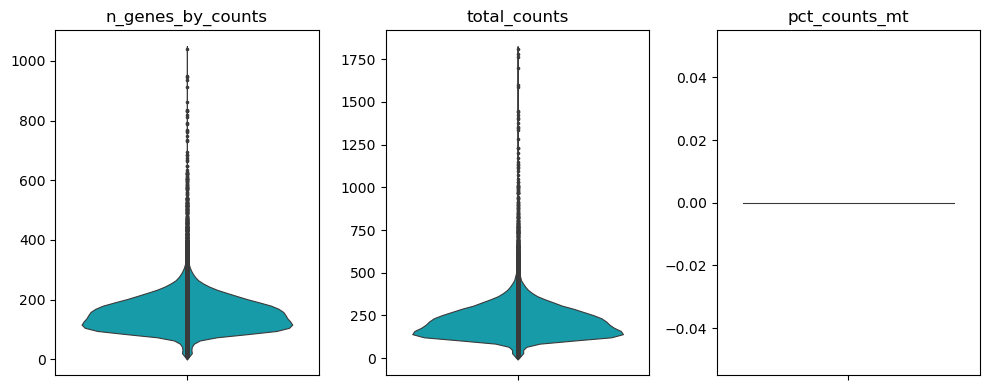

In [24]:
qc_metrics = ["n_genes_by_counts", "total_counts", "pct_counts_mt"]

plt.figure(figsize=(10,4))
for i, metric in enumerate(qc_metrics):
    plt.subplot(1, 3, i+1)
    sns.violinplot(y=adata.obs[metric], color="#00AFC1", inner="point", linewidth=0.8)
    plt.title(metric)
    plt.xlabel("")
    plt.ylabel("")
plt.tight_layout()
plt.show()


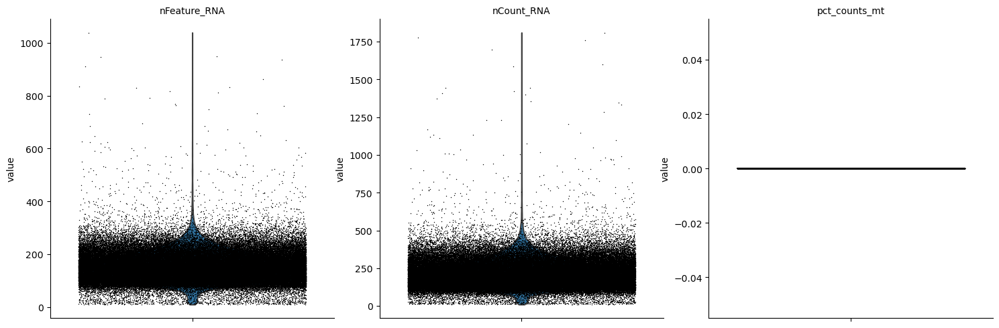

In [25]:
sc.pl.violin(
    adata,
    ["nFeature_RNA", "nCount_RNA", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

In [26]:
adata = adata[
    (adata.obs["nFeature_RNA"] > 500) &
    (adata.obs["nFeature_RNA"] < 7500) &
    (adata.obs["pct_counts_mt"] < 25),
    :
]


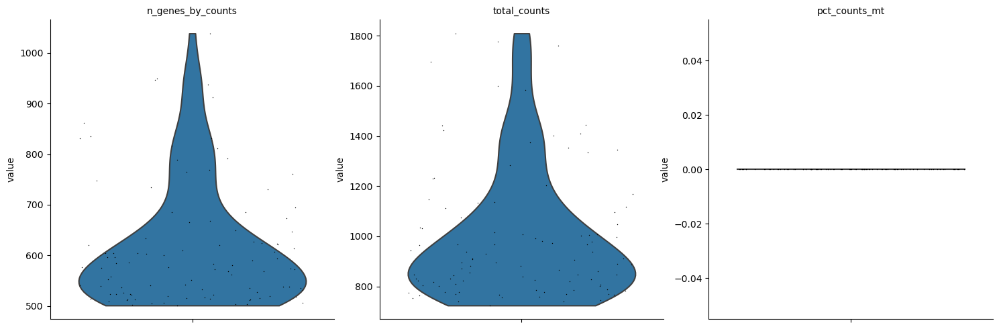

In [27]:
sc.pl.violin(
    adata,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

In [20]:
adata = adata[:, adata.var.highly_variable]

In [21]:
sc.pp.regress_out(adata, ["total_counts", "pct_counts_mt"])

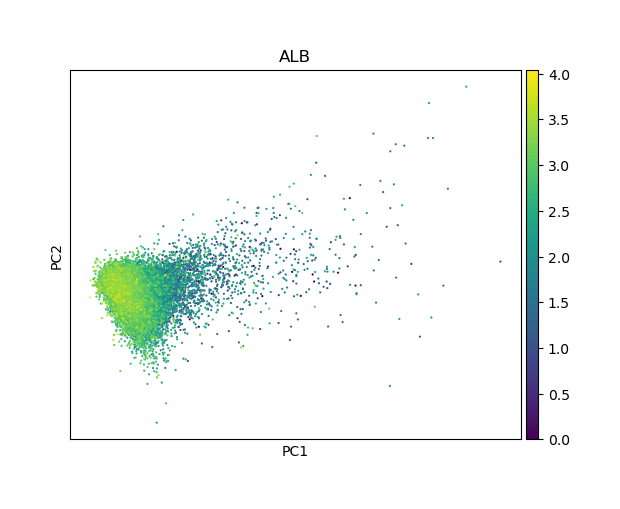

In [24]:
sc.pl.pca(adata, color="ALB",s=10)

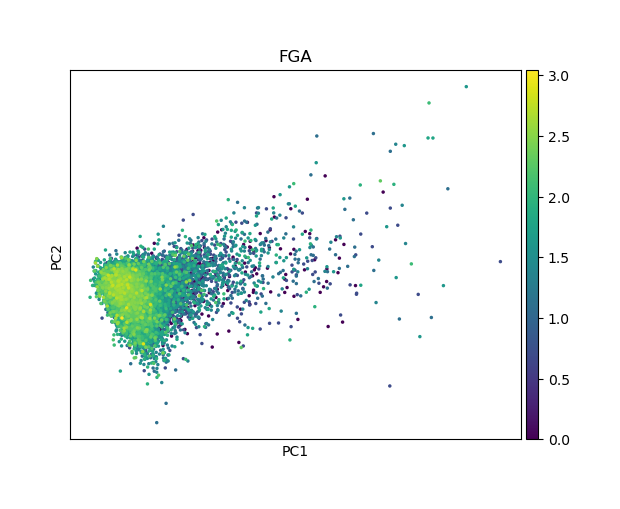

In [26]:
sc.pl.pca(adata, color="FGA",s=25)